<a href="https://colab.research.google.com/github/KeeganCadiz/Prob-Stats/blob/main/TrueOrFalseProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [ ]:
import matplotlib.pyplot as plt
import imageio
import torch
import torchvision
from torchvision import models, transforms
import numpy as np
from torchvision.models import *
from PIL import Image
import requests
from torchvision import models
from torchsummary import summary

Define a function to plot images

In [ ]:
def plot(x): # Takes an image matrix 'x' and displays it using matplotlib with a specific size, gray color map, and no axis.
    fig, ax = plt.subplots()
    im = ax.imshow(x,cmap='gray')
    ax.axis('off')
    fig.set_size_inches(20, 20)
    plt.show()

Read and display an image (or in this case, multiple images together)

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png') # read

<ipython-input-3-8605682211cb>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png') # read


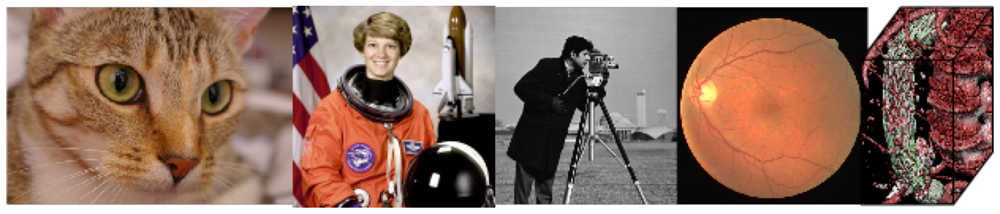

In [ ]:
plot(im) # display

In [ ]:
net = alexnet(pretrained=True).cuda(0) # loads a pre trained alexnet model

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:04<00:00, 49.7MB/s]


In [ ]:
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406], # normalize mean values for each RGB channel
   std=[0.229, 0.224, 0.225] # normalize standard deviation values for each RGB channel
)
preprocess = transforms.Compose([
   transforms.Resize(256),  # resize input image to 256x256 pixels
   transforms.CenterCrop(224),  # crop the central 224x224 pixels
   transforms.ToTensor(), # convert to to pytorch tensor
   normalize  # applies normalized mean and standard de
])

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg') # new image

<ipython-input-7-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


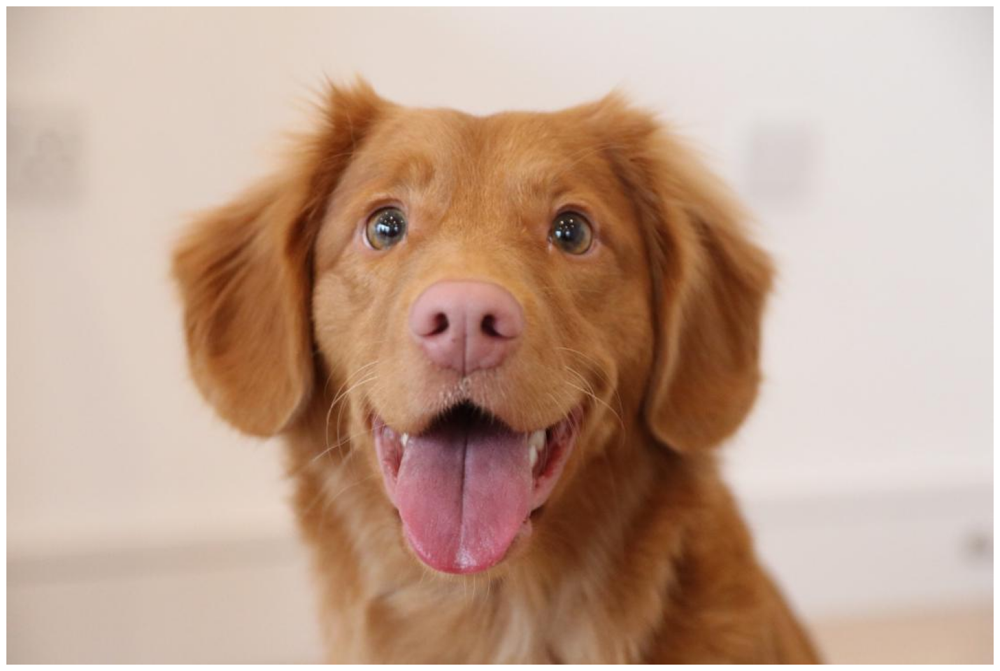

In [ ]:
plot(im)

In [ ]:
image = Image.fromarray(im) #convert to pil

In [ ]:
img_tensor = preprocess(image)  # applies preprocess user defined function from earlier

In [ ]:
img_tensor = img_tensor.unsqueeze_(0) # Adds a batch dimension (makes it suitable for model input)

In [ ]:
img_tensor.shape  # [batch size, channels, height, width]

torch.Size([1, 3, 224, 224])

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0) # converts tensor to pytorch tensor and moves to GPU

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


Perform inference with the neural network

In [ ]:
out = net(img_variable) # pass processed image through the network

In [ ]:
label_index = out.cpu().data.numpy().argmax() # Get the index of the highest response in the output

In [ ]:
label_index # Displays the index of the highest response

215

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) # Get the indices of the top 10 responses

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json' # URL containing JSON file with labels for classification outputs

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()} # Download and parse the label JSON

In [ ]:
print(labels[label_index])  # Print the label of the highest response

Brittany spaniel


In [ ]:
for i in range(10): # Print the top 10 labels
    print(labels[top_list[i]])

Brittany spaniel
golden retriever
Sussex spaniel
clumber, clumber spaniel
tennis ball
Irish setter, red setter
cocker spaniel, English cocker spaniel, cocker
Tibetan mastiff
Welsh springer spaniel
Blenheim spaniel


Show summary of the neural network

In [ ]:
net # Display the loaded AlexNet model's structure

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224)) # Display a detailed summary of the model including output sizes and number of parameters

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

Extract and plot the response from the first layer of the network

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy()  # Get the output from the first layer of the model and detach it from the GPU to numpy

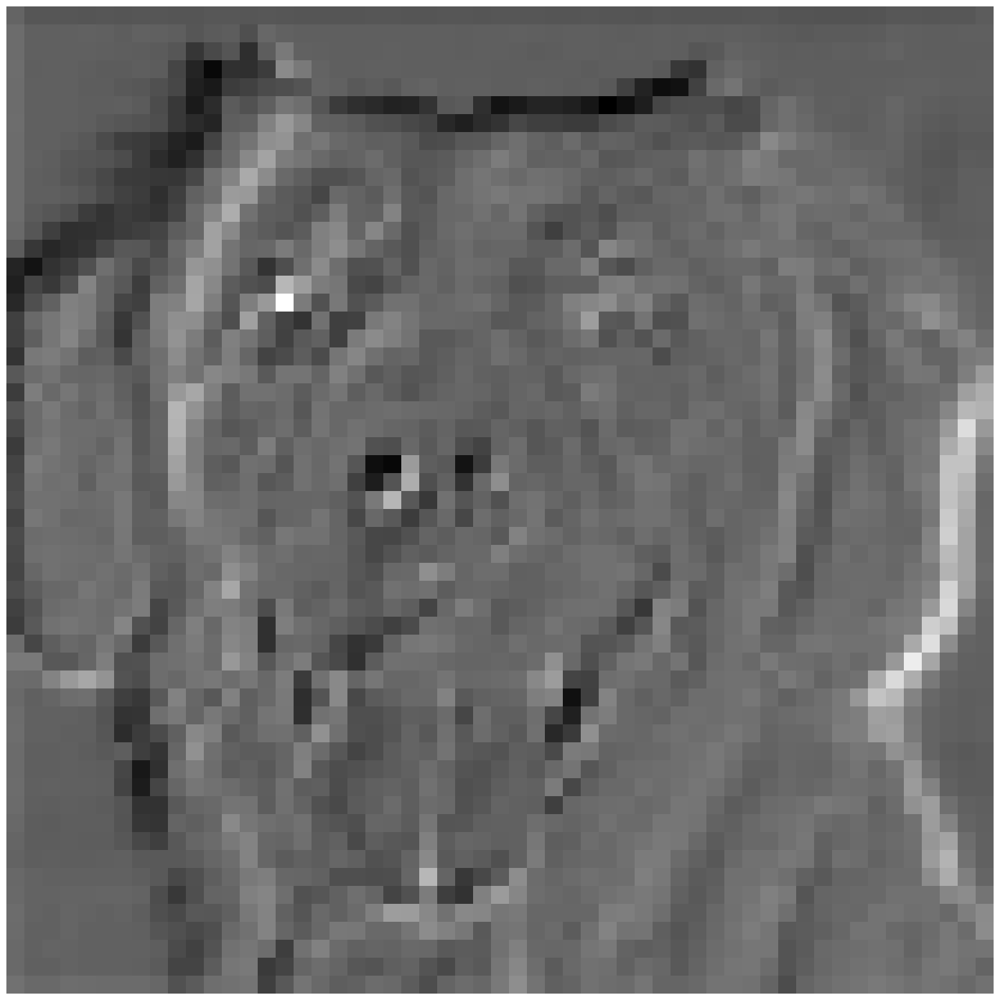

In [ ]:
plot(out[0,0,:,:])  # Plot the response from the first channel of the first feature map

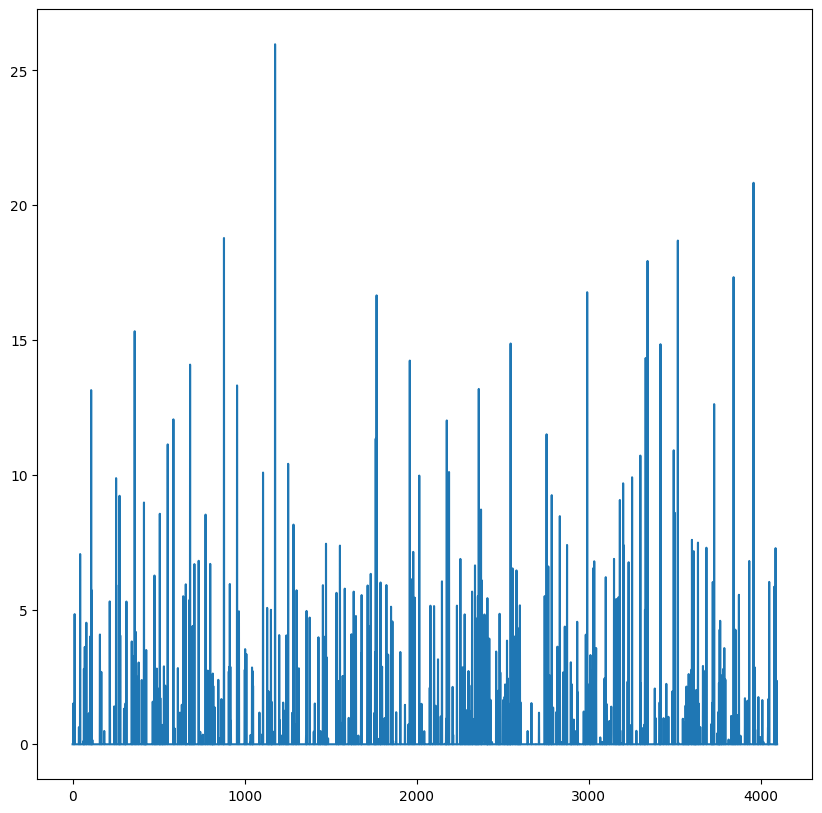

In [ ]:
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
# Plot the output of the classifier section of the network before the final classification layer
fig = plt.gcf() # Get the current figure
fig.set_size_inches(10, 10) # Set the figure size

Read, process, and infer from a live image

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php') # gets newest photo of the Boca Raton beach

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


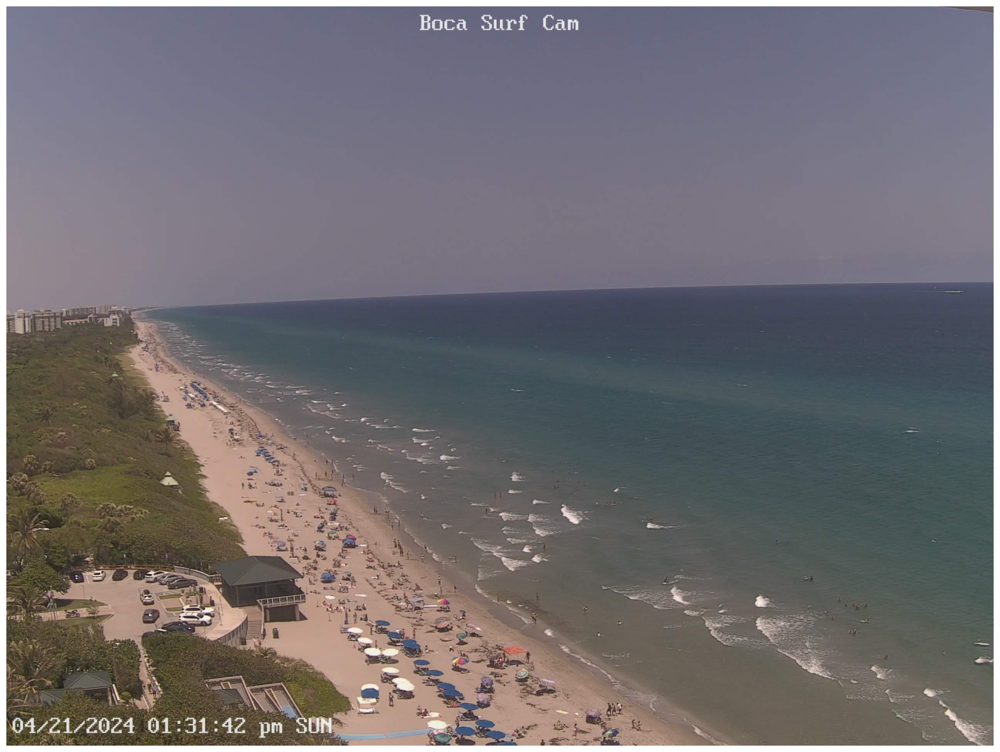

In [ ]:
plot(im)  # live beach cam

In [ ]:
def load_im(im):  # Function to convert an image array into a preprocessed tensor that is ready for model inference.
    image = Image.fromarray(im) #convert to pil
    img_tensor = preprocess(image)
    img_tensor = img_tensor.unsqueeze_(0)
    img_variable = torch.tensor(img_tensor).cuda(0)
    return img_variable

In [ ]:
out = net(load_im(im))  # Load the image, preprocess it, and run it through the network

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
def inference(im):  #  Function to perform inference on an image, print the most likely label, and the top 10 likely labels.
    out = net(load_im(im))
    label_index = out.cpu().data.numpy().argmax()
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
    print(labels[label_index])
    print('____')
    for i in range(10):
        print(labels[top_list[i]])

In [ ]:
inference(im) # perform interference function // most likely label at top, followed by 10 other likely labels

promontory, headland, head, foreland
____
promontory, headland, head, foreland
seashore, coast, seacoast, sea-coast
breakwater, groin, groyne, mole, bulwark, seawall, jetty
sandbar, sand bar
cliff, drop, drop-off
dam, dike, dyke
valley, vale
lakeside, lakeshore
volcano
aircraft carrier, carrier, flattop, attack aircraft carrier


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [ ]:
%%capture
!pip install wandb  # reinstall and import all necessary librarys (since runtime was disconnected and deleted)
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb

In [ ]:
def GPU(data):  # Function to convert data to a tensor with gradient tracking, suitable for training on a GPU.
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data): # Function to convert data to a tensor without gradient tracking, suitable for inference or testing on a GPU.
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

In [ ]:
def plot(x):  # Redefines the plot function to adjust to a smaller size specifically for plotting images converted from PDFs
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()

Functions to get google slides as images

In [ ]:
def get_google_slide(url):  # Extract the PDF export URL from a Google Slides URL
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):  # Download Google Slides as PDF and convert each slide to an image at 500 DPI
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # Setup the device to use for computation. Use GPU if available, otherwise fall back to CPU

Load images, preprocess, and setup model for inference

In [ ]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()} # Load classification labels from a remote JSON file

In [ ]:
model = alexnet(weights='DEFAULT').to(device) # Load AlexNet with default weights, set to eval mode, and transfer to computation device
model.eval(); # Set the model to evaluation mode

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 89.2MB/s]


In [ ]:
url = "https://docs.google.com/presentation/d/1aKBK5Rk0dHPSbslWuY-U8W9WMDvVBVf3Qwqw9GzC69g/edit#slide=id.g2b78f0cdfdb_0_4"

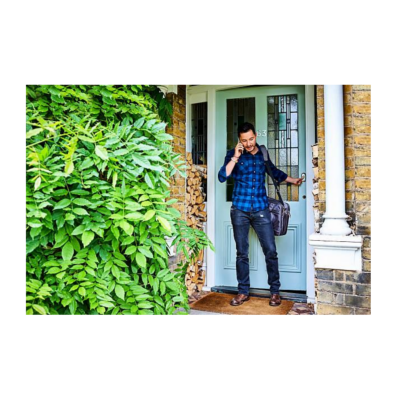

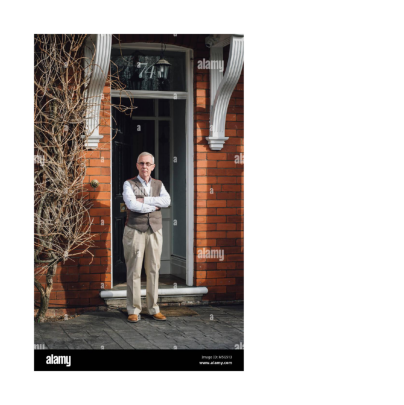

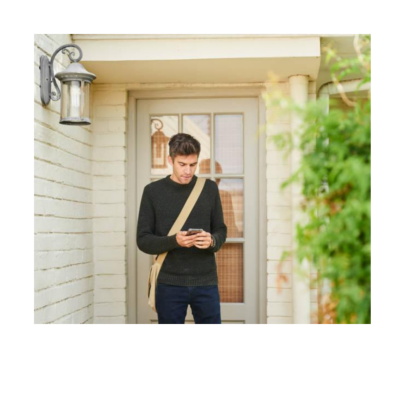

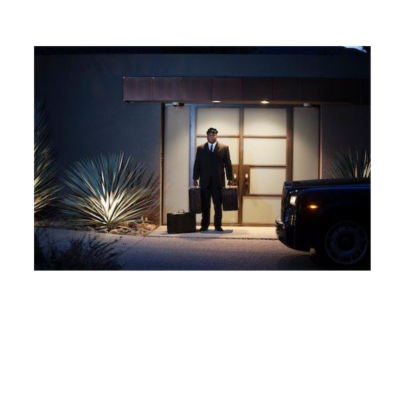

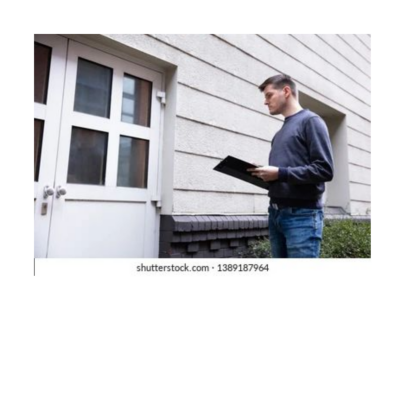

...

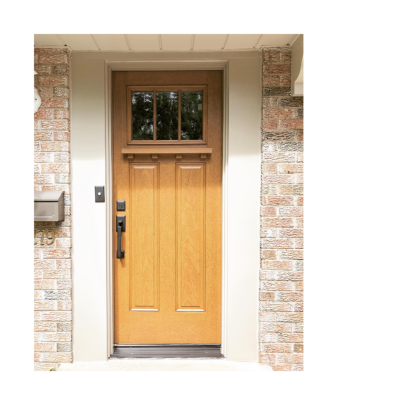

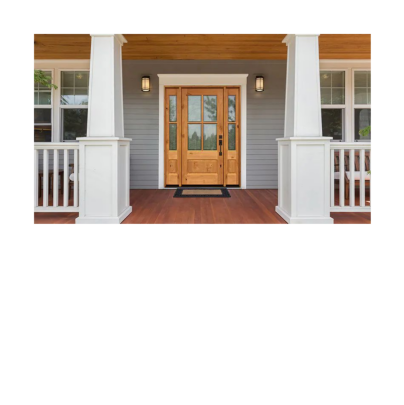

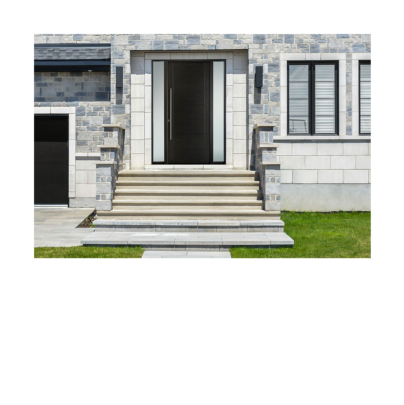

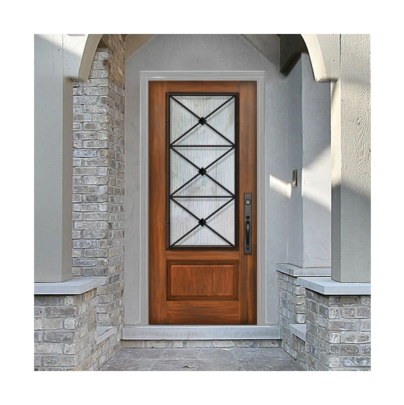

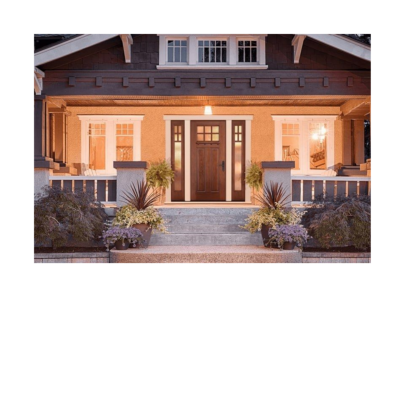

In [ ]:
images = []

for image in get_slides(url):

    plot(image) # Display each slide as an image

    images.append(load(image))  # Load and preprocess each image, then append to list

images = torch.vstack(images) # Stack all image tensors vertically to create a batch

In [ ]:
images.shape  # Display the shape of the batch tensor

torch.Size([50, 3, 224, 224])

In [ ]:
model(images) # Pass the batch of images through the model

tensor([[-0.5032, -0.5585, -1.4326,  ..., -3.1407,  1.3067,  1.7859],
        [-4.0753, -2.8250, -1.4622,  ..., -3.2862, -0.8647, -0.2432],
        [-2.7174, -3.4887, -1.2918,  ..., -6.2430, -0.3473,  4.0658],
        ...,
        [-0.6215, -2.9093, -4.7606,  ..., -5.1065,  0.4426,  1.6887],
        [-3.4511, -1.0513, -1.0322,  ..., -1.9686, -3.2211,  3.6815],
        [-1.2396, -3.7318, -3.3193,  ..., -1.7633, -1.0923, -1.9119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images)

In [ ]:
y.shape # Display the shape of the output tensor

torch.Size([50, 1000])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy()  # Get the index of the highest probability class for each image in the batch

In [ ]:
for i in list(guesses):
    print(labels[i])  # Print the predicted label for each image

web site, website, internet site, site
china cabinet, china closet
abaya
sliding door
mobile home, manufactured home
abaya
barn
wardrobe, closet, press
pay-phone, pay-station
turnstile
lab coat, laboratory coat
web site, website, internet site, site
web site, website, internet site, site
sliding door
medicine chest, medicine cabinet
web site, website, internet site, site
bookcase
monitor
web site, website, internet site, site
bookcase
recreational vehicle, RV, R.V.
web site, website, internet site, site
envelope
medicine chest, medicine cabinet
broom
mobile home, manufactured home
window shade
sliding door
prayer rug, prayer mat
entertainment center
mobile home, manufactured home
mobile home, manufactured home
sliding door
sliding door
patio, terrace
entertainment center
mobile home, manufactured home
sliding door
cash machine, cash dispenser, automated teller machine, automatic teller machine, automated teller, automatic teller, ATM
bell cote, bell cot
mobile home, manufactured home
a

Define additional data handling and visualization functions

In [ ]:
Y = np.zeros(50,) # Initialize an array of 50 zeros
Y[25:] = 1  # Set the last 25 elements of the array to 1, creating a binary class label to differentiate cats/dogs or visitor/no visitor.

In [ ]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy()  # Detach the output tensor 'y' from the GPU, convert to numpy array for further processing

In [ ]:
X.shape

(50, 1000)

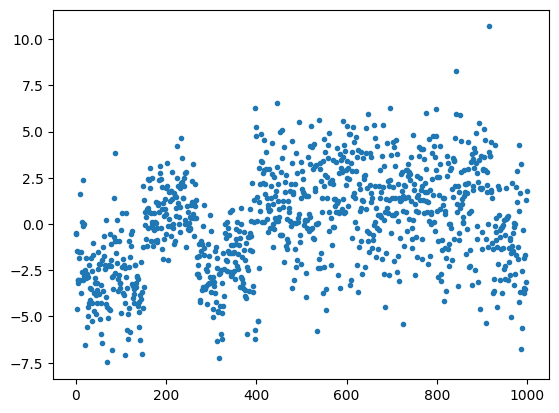

In [ ]:
plt.plot(X[0],'.')  # Plot the first element of 'X' using dot markers

In [ ]:
X[0]  # value of each dot displayed above

array([-5.03241897e-01, -5.58459878e-01, -1.43260193e+00, -4.61965227e+00,
       -3.02321482e+00, -3.18268347e+00, -3.04389977e+00, -1.51457870e+00,
       -1.86467004e+00,  1.64297795e+00, -3.02091122e+00, -3.71506596e+00,
       -1.50574398e+00, -2.61872315e+00,  1.05224967e-01, -9.14023519e-02,
       -3.05122185e+00,  2.36292267e+00,  2.55819261e-02, -2.82974219e+00,
       -6.53775024e+00, -2.46831036e+00, -1.81495368e+00, -2.94153023e+00,
       -2.68703604e+00, -5.55684662e+00, -4.49797869e+00, -2.86986637e+00,
       -4.97443295e+00, -2.23911977e+00, -4.25522375e+00, -3.47071123e+00,
       -4.12765408e+00, -3.49309897e+00, -1.82201552e+00, -5.25128269e+00,
       -2.52552199e+00, -4.25303984e+00, -1.64888465e+00, -1.03113508e+00,
       -4.68146038e+00, -3.71732807e+00, -3.19025087e+00, -2.89409471e+00,
       -4.84641266e+00, -3.85962749e+00, -3.21220827e+00, -4.27077055e+00,
       -3.58661032e+00, -2.45274544e+00, -1.54004514e+00, -2.13794184e+00,
       -3.77435660e+00, -

In [ ]:
np.argmax(X[0]) # Find the index of the maximum value in the first element of 'X'

916

In [ ]:
labels[948] # label of that maximum value

'Granny Smith'

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10]  # Get the indices of the top 10 values in the first element of 'X'

In [ ]:
for i in top_ten:
    print(labels[i])  # Print the labels corresponding to the top 10 indices (all should be dogs/visitors)

web site, website, internet site, site
swing
binder, ring-binder
abacus
paintbrush
sliding door
sarong
swimming trunks, bathing trunks
medicine chest, medicine cabinet
television, television system


In [ ]:
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 20.,  60., 172., 197., 251., 190.,  90.,  18.,   1.,   1.]),
 array([-7.48708725, -5.67036867, -3.85365009, -2.03693151, -0.22021294,
         1.59650564,  3.41322422,  5.2299428 ,  7.04666138,  8.86338043,
        10.68009853]),
 <BarContainer object of 10 artists>)

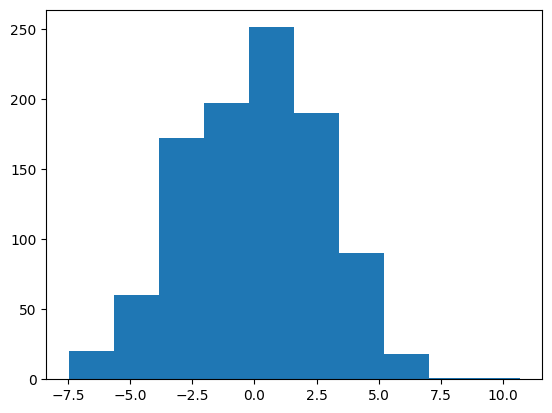

In [ ]:
plt.hist(X[0])   # Plot a histogram of the values in the first element of 'X'

Advanced tensor manipulation and custom functions

In [ ]:
X = GPU_data(X) # Convert the numpy array 'X' to a PyTorch tensor suitable for GPU computation
Y = GPU_data(Y) # Convert the numpy array 'Y' to a PyTorch tensor suitable for GPU computation

In [ ]:
def softmax(x):  # Compute the softmax of vector x in a numerically stable way.
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [ ]:
def cross_entropy(outputs, labels): # Compute the cross entropy loss between outputs (predictions) and labels.
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

In [ ]:
def Truncated_Normal(size): # Generate truncated normal variables for initial weights

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [ ]:
def acc(out,y): # Calculate the accuracy of predictions 'out' compared to true labels 'y'.
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [ ]:
X.shape

torch.Size([50, 1000])

Training loop and model evaluation setup

In [ ]:
def get_batch(mode):  # Fetch a batch of data for training or testing.
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [ ]:
def model(x,w): # Simple linear model multiplying input 'x' with weights 'w'.

    return x@w[0]

In [ ]:
def make_plots(): # Make and log plots for tracking in Weights & Biases

    acc_train = acc(model(x,w),y)

    wb.log({"acc_train": acc_train})

In [ ]:
wb.init(project="Linear_Model_Photo_1");  # Initialize a Weights & Biases project
c = wb.config # Configuration object from Weights & Biases

c.h = 0.001 # Learning rate
c.b = 4 # Batch size
c.epochs = 100000 # Number of epochs

w = [GPU(Truncated_Normal((1000,2)))] # Initialize weights using the truncated normal distribution, for a simple model with 1000 inputs and 2 outputs

optimizer = torch.optim.Adam(w, lr=c.h) # Initialize Adam optimizer with the learning rate from config

for i in range(c.epochs):

    x,y = get_batch('train')  # Get a batch of training data

    loss = cross_entropy(softmax(model(x,w)),y) # Compute loss

    optimizer.zero_grad() # Clear gradients
    loss.backward()  # Backpropagate to compute gradients
    optimizer.step()  # Update weights

    wb.log({"loss": loss})  # Log loss to Weights & Biases

    make_plots()  # Make and log plots


<IPython.core.display.Javascript object>

In [ ]:
# acc_train (https://wandb.ai/keegancadiz/Linear_Model_Photo_1/reports/acc_train-24-04-05-17-01-50---Vmlldzo3NDMxMzMy)

This graph shows accuracy. The y-axis is a percentage where 100 is 100% accurate, and the x-axis is total iterations.

In [ ]:
# loss (https://wandb.ai/keegancadiz/Linear_Model_Photo_1/reports/loss-24-04-05-17-02-14---Vmlldzo3NDMxMzM2)

This graph shows loss. The loss function quantifies the difference between the predicted values and the actual values and serves as an objective measure of how well the model is performing. The y-axis shows the loss value (0 is perfect score), and the x-axis shows total iterations.